In [2]:
### Import packages

from __future__ import print_function
import numpy as np
import pandas as pd
import chartify
import sys
import os
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import bokeh
import bokeh.io as bk_io
from bokeh.io import export_svgs, export_png
from bokeh.plotting import figure, output_file, show, save
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, CDSView, BooleanFilter, Span, Label,  Arrow, OpenHead, NormalHead, VeeHead, HoverTool
from bokeh.models import ColumnDataSource, Label, LabelSet, Range1d
from bokeh.transform import factor_cmap, factor_mark
from bokeh.palettes import Spectral6, Dark2, cividis, Viridis, viridis



/Users/taylorjones/.pyenv/versions/3.7.4/lib/python3.7/site-packages/pandas/compat/__init__.py:85: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)
/Users/taylorjones/.pyenv/versions/3.7.4/lib/python3.7/site-packages/pandas/compat/__init__.py:85: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


# Volcano Plots

In [3]:
p53 = pd.read_csv('/Users/taylorjones/Desktop/p53_target_andrysik2018.txt', sep='\t', header=None)
p53.columns = ['gene', 'pathway']
p53list=list(p53['gene'])

In [8]:
TITLE_FONT_SIZE = '28pt'
AXES_FONT_SIZE = '28pt'
LEGEND_FONT_SIZE = '24pt'
LABEL_FONT_SIZE = '16pt'

indir = '/Users/taylorjones/Desktop/Peptide_Project/expt1_deseq2/'
# indir = '/Users/taylorjones/Desktop/Peptide_Project/expt2_limma_correction_deseq2/'

# outdir = '/Users/taylorjones/Desktop/peptide_figures/'
condition = 'DWvNW'

df = pd.read_csv(indir + condition + '_diffexpr-results_DESeq2.txt', sep='\t')
df = df[['Gene','baseMean','padj','log2FoldChange']]

df = df.dropna(subset = ['padj'])
df['log10_padj'] = -np.log10(df['padj'].replace(0, np.nan))

df

,Gene,baseMean,padj,log2FoldChange,log10_padj
0,BTG2,918.097601,1.064778e-12,1.812786,11.972741
1,CDKN1A,4962.238207,3.844137e-10,1.637948,9.415201
2,PHLDA3,909.772193,3.125913e-08,1.917207,7.505023
3,MIR34AHG,359.502702,1.314657e-06,1.625713,5.881187
4,SESN2,800.795493,1.608784e-06,1.730790,5.793502
...,...,...,...,...,...
25316,ZSCAN4,0.858400,1.000000e+00,0.000000,-0.000000
25317,ZSCAN5A,129.436537,1.000000e+00,0.001546,-0.000000
25318,ZSWIM2,0.379768,1.000000e+00,-0.149181,-0.000000
25319,ZWINT,1544.223966,1.000000e+00,-0.029505,-0.000000


In [13]:
# sp=p53list
# sp=['CDKN1A', 'PHLDA3','MDM2']
sig = df[['Gene', 'log2FoldChange', 'padj', 'log10_padj']]
sig = df.loc[sig['padj'] <= 0.05]
sig_p53=sig[(sig['Gene'].isin(p53list))]
sp = list(sig_p53['Gene'])

def gene_label(row, gene_list):
    for gene in gene_list:
        if row['Gene'] == gene:
            return gene
        else:
            continue
def alpha(row, gene_list):
    for gene in gene_list:
        if row['Gene'] == gene:
            return 1
        else:
            continue
def outline(row, gene_list):
    for gene in gene_list:
        if row['Gene'] == gene:
            return 'black'
        else:
            continue    
def f(row):
    if (row['padj'] <= 0.05) & (row['log2FoldChange'] > 0):
        return '#EE7416'
    if (row['padj'] <= 0.05) & (row['log2FoldChange'] < 0):
        return '#3484BF'
    else:
        return 'black'
df['colors'] = df.apply(lambda row: f(row), axis=1)
df['outline'] = df.apply(lambda row: outline(row, sp), axis=1)
df['alpha'] = df.apply(lambda row: alpha(row, sp), axis=1)
df['label'] = df.apply(lambda row: gene_label(row, sp), axis=1)
df['alpha']=df['alpha'].fillna(0.5)
df['outline']=df['outline'].fillna('')
df['label']=df['label'].fillna('')

In [14]:
source = ColumnDataSource(df)

## create a new plot and add a renderer
# p = figure(plot_width=1200, plot_height=1200, title=None, x_range=(-4, 4), y_range=(0, 7.5))
p = figure(plot_width=1200, plot_height=1200, title=None)

p.xaxis.axis_label = 'Log2(Average Fold Change)'
p.yaxis.axis_label = '-Log10(Adjusted p-value)'
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.xaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.yaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.xaxis.axis_label_text_font_style = 'bold'
p.yaxis.axis_label_text_font_style = 'bold'
p.xaxis.major_label_text_font_size = AXES_FONT_SIZE
p.yaxis.major_label_text_font_size = AXES_FONT_SIZE

hline1 = Span(location=1.301, dimension='width', line_color='black', line_width=2, line_dash='dashed')
vline1 = Span(location=0, dimension='height', line_color='black', line_width=2, line_dash='dashed')

p.renderers.extend([hline1, vline1])

lab1 = Label(x=4, y=1.4, text='padj<0.05', text_font_style = 'bold', text_font_size = LABEL_FONT_SIZE,
            render_mode='canvas')

p.add_layout(lab1)
labels = LabelSet(x='log2FoldChange', y='log10_padj',
                  text='label', x_offset=5, y_offset=8, 
                  source=source, text_font_size="22pt")


p.circle('log2FoldChange', 'log10_padj', size=12,
            color='colors', line_color='outline', fill_alpha='alpha',
            source=source)

p.add_layout(labels)
p.yaxis.major_label_text_color = "black"


# save(p)
export_png(p, filename = outdir + condition + '_expt1_volcano_plot.png')
# export_png(p, filename = outdir + condition + '_expt2_volcano_plot.png')
p.output_backend = "svg"
export_svgs(p, filename = outdir + condition + '_expt1_volcano_plot.svg')
# export_svgs(p, filename = outdir + condition + '_expt2_volcano_plot.svg')
show(p)

# GSEA Enrichment Score Heatmap

In [2]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
pink = np.array([248/256, 24/256, 148/256, 1])
newcolors[:25, :] = pink
newcmp = ListedColormap(newcolors)


def plot_examples(cms):
    """
    helper function to plot two colormaps
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)

    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    for [ax, cmap] in zip(axs, cms):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()

#plot_examples([viridis, newcmp])


top = cm.get_cmap('Blues_r', 128)
bottom = cm.get_cmap('YlOrBr', 128)

newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
newcmp = ListedColormap(newcolors, name='OrangeBlue')
#plot_examples([viridis, newcmp])

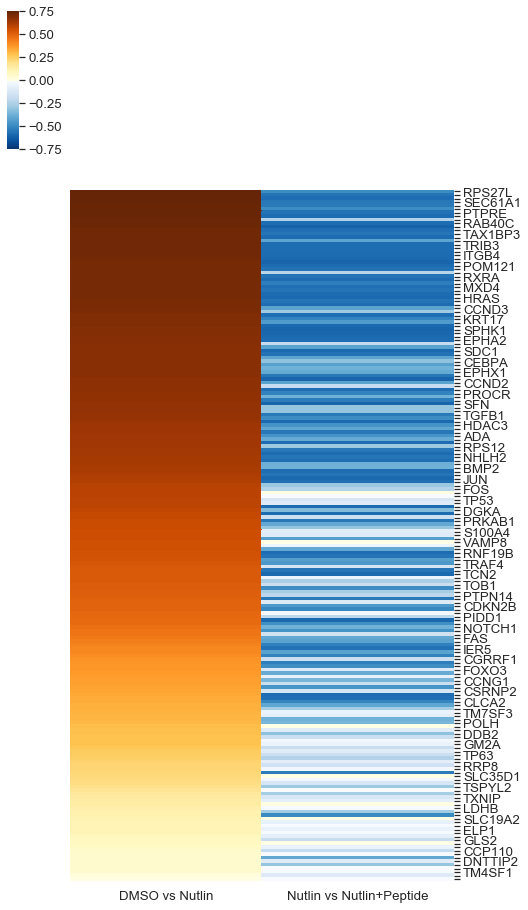

In [5]:
df = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/DWvNW/HALLMARK_P53_PATHWAY.csv', sep='\t')
df=df[['PROBE', 'RUNNING ES']]

dp = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/NWvNP/HALLMARK_P53_PATHWAY.csv', sep='\t')
dp=dp[['PROBE', 'RUNNING ES']]

df=df.merge(dp,on='PROBE', suffixes=('_dwnw', '_nwnp'))
df

df=df.sort_values(by='RUNNING ES_dwnw', ascending=False)
df=df.reset_index()
df=df.reset_index()
df['PROBE_space'] = np.where(df['level_0'] % 3 == 0, df['PROBE'], '')

sns.set(font="arial", font_scale=1.2)

plt = sns.clustermap(df[['RUNNING ES_dwnw', 'RUNNING ES_nwnp']], cmap=newcmp, 
                     yticklabels=df['PROBE_space'], method='ward', figsize=(8, 16), 
                     row_cluster=False, col_cluster=False, vmin=-0.75, vmax=0.75,
                    xticklabels=['DMSO vs Nutlin', 'Nutlin vs Nutlin+Peptide'])

# plt.savefig('/Users/taylorjones/Desktop/Peptide_Project/#2021-08/gsea_running_es_heatmap_expt2.pdf')


In [9]:
df_export = df[['PROBE', 'RUNNING ES_dwnw', 'RUNNING ES_nwnp']]
df_export.columns=['p53 Target Gene', 'GSEA Enrichment Score DMSO vs Nutlin', 'GSEA Enrichment Score Nutlin vs Nutlin+Peptide']
df_export.to_csv('/Users/taylorjones/Desktop/Peptide_Project/##peptide_figures/GSEA_heatmap_information.csv',
                index=False, sep='\t')

# GSEA Mustache Plots

In [ ]:
## Import data
#expt1
# dfDWNW_neg = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/DWvNW/gsea_report_for_na_neg_1629983390610.xls',
#                         sep='\t')
# dfDWNW_pos = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/DWvNW/gsea_report_for_na_pos_1629983390610.xls',
#                         sep='\t')

# dfNWNP_neg = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/NWvNP/gsea_report_for_na_neg_1629983403538.xls',
#                         sep='\t')
# dfNWNP_pos = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt1/NWvNP/gsea_report_for_na_pos_1629983403538.xls',
#                         sep='\t')
#expt2
dfDWNW_neg = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt2/DWvNW/gsea_report_for_na_neg_1633036814252.xls',
                        sep='\t')
dfDWNW_pos = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt2/DWvNW/gsea_report_for_na_pos_1633036814252.xls',
                        sep='\t')

dfNWNP_neg = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt2/NWvNP/gsea_report_for_na_neg_1633036822788.xls',
                        sep='\t')
dfNWNP_pos = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/GSEA_output/expt2/NWvNP/gsea_report_for_na_pos_1633036822788.xls',
                        sep='\t')

In [30]:
##Format data

dfDWNW= pd.concat((dfDWNW_neg, dfDWNW_pos), axis=0)
dfDWNW = dfDWNW.reset_index()
dfDWNW = dfDWNW[['NAME', 'NES', 'FDR q-val']]
dfDWNW
dfDWNW['NAME'] = dfDWNW['NAME'].str.replace('HALLMARK_', ' ')
dfDWNW['NAME'] = dfDWNW['NAME'].str.replace('_', ' ')
dfDWNW['NAME'] = dfDWNW['NAME'].str.title()
dfDWNW

dfNWNP= pd.concat((dfNWNP_neg, dfNWNP_pos), axis=0)
dfNWNP = dfNWNP.reset_index()
dfNWNP = dfNWNP[['NAME', 'NES', 'FDR q-val']]
dfNWNP
dfNWNP['NAME'] = dfNWNP['NAME'].str.replace('HALLMARK_', ' ')
dfNWNP['NAME'] = dfNWNP['NAME'].str.replace('_', ' ')
dfNWNP['NAME'] = dfNWNP['NAME'].str.title()

In [ ]:
def outline(row):
    if (row['NAME'] == ' P53 Pathway'):
        return 'black'   
    else:
        return 'black'

def alpha(row):
    if (row['NAME'] == ' P53 Pathway'):
        return 1    
    else:
        return 0.3


def pathway(row):
    if (row['NAME'] == ' P53 Pathway'):
        return 'p53 pathway'
    else:
        return ''    


def f(row):
    if (row['FDR q-val'] <= 0.1) & (row['NES'] > 0):
        return '#EE7416'
    if (row['FDR q-val'] <= 0.1) & (row['NES'] < 0):
        return '#3484BF'
    else:
        return 'black'


In [156]:
TITLE_FONT_SIZE = '30pt'
AXES_FONT_SIZE = '30pt'
LEGEND_FONT_SIZE = '24pt'
LABEL_FONT_SIZE = '18pt'

df['colors'] = df.apply(lambda row: f(row), axis=1)
df['label'] = df.apply(lambda row: pathway(row), axis=1)
df['outline'] = df.apply (lambda row: outline(row), axis=1)
df['alpha'] = df.apply (lambda row: alpha(row), axis=1)

source = ColumnDataSource(df)
SAMPLE = df['colors'].unique()

## create a new plot and add a renderer
p = figure(plot_width=1200, plot_height=1200, title=None, x_range=(-4, 4), y_range=(-0.05, 1.1))
# p = figure(plot_width=1200, plot_height=1200, title=None)

p.xaxis.axis_label = 'NES'
p.yaxis.axis_label = 'FDR q-value'
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.xaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.yaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.xaxis.axis_label_text_font_style = 'bold'
p.yaxis.axis_label_text_font_style = 'bold'
p.xaxis.major_label_text_font_size = AXES_FONT_SIZE
p.yaxis.major_label_text_font_size = AXES_FONT_SIZE

hline1 = Span(location=0, dimension='width', line_color='black', line_width=2, line_dash='solid')
hline2 = Span(location=0.1, dimension='width', line_color='black', line_width=2, line_dash='dashed')
vline1 = Span(location=0, dimension='height', line_color='black', line_width=2, line_dash='dashed')


p.renderers.extend([hline1, hline2, vline1])

lab1 = Label(x=-3.8, y=0.11, text='FDR q-val <0.1', text_font_style = 'bold', text_font_size = LABEL_FONT_SIZE)
lab2 = Label(x=0.9, y=1.06, text='Positive Enrichment', text_font_style = 'bold', text_color= '#EE7416',
             text_font_size = LEGEND_FONT_SIZE)
lab3 = Label(x=-3.2, y=1.06, text='Negative Enrichment', text_font_style = 'bold', text_color= '#3484BF',
             text_font_size = LEGEND_FONT_SIZE)

################### UPREGULATED/DOWNREGULATED ########################################

p.add_layout(Arrow(end=VeeHead(size=10, line_color='#EE7416', fill_color='#EE7416'), line_color='#EE7416', line_width=3,
                   x_start= 0.1 , y_start=1.05, x_end=3.8, y_end=1.05))
p.add_layout(Arrow(end=VeeHead(size=10, line_color='#3484BF', fill_color='#3484BF'), line_color='#3484BF', line_width=3,
                   x_start=-0.1, y_start=1.05, x_end=-3.8, y_end=1.05))

############################################################################################

p.add_layout(lab1)
p.add_layout(lab2)
p.add_layout(lab3)


# labels = LabelSet(x='NES', y='FDR q-val',
#                   text='label', x_offset=-160, y_offset=-40, 
#                   source=source, text_font_size="22pt")
labels = LabelSet(x='NES', y='FDR q-val',
                  text='label', x_offset=20, y_offset=-10, 
                  source=source, text_font_size="22pt")
p.add_layout(labels)



p.circle('NES', 'FDR q-val', size=20,
            color='colors', line_color='outline', fill_alpha='alpha',
            source=source)

p.yaxis.major_label_text_color = "black"

#grid = gridplot([s1], ncols=3, plot_width=600, plot_height=600)
# save(p)
# export_png(p, filename = outdir + 'mustache_plot_dwnw_expt2.png')

outdir = '/Users/taylorjones/Desktop/Peptide_Project/#2021-08/'
export_png(p, filename = outdir + cond +'_Mustache_expt2.png')

show(p)



# RPKM plots rna-seq

In [1]:
###functions for pretty plots    
def f(row):
    if (row['diff'] > 0) & (row['sig'] == True) & (row['p53filt'] == True): 
        return '#EE7416'    
    elif (row['diff'] > 0) & (row['sig'] == True):
        return '#FB8404'
    elif (row['diff'] < 0) & (row['sig'] == True):
        return '#3484BF'
    else:
        return '#b9b9b9'
    
    
def fo(row):
    if (row['diff'] > 0) & (row['sig'] == True) & (row['p53filt'] == True): 
        return '#DF6000'    
    elif (row['diff'] > 0) & (row['sig'] == True):
        return '#FB8404'
    elif (row['diff'] < 0) & (row['sig'] == True):
        return '#084387'
    else:
        return '#b9b9b9'


def alpha(row):
    if (row['sig'] == True) & (row['p53filt'] == True):
        return 0.7
    if (row['sig'] == True) & (row['p53filt'] == False):
        return 0.2
    else:
        return 0.1
    

## expt1

In [2]:
df = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/expt1_rnaseq_rpkm.txt', sep='\t')
df.describe()
# df[(df['gene'] == 'MT1M')]

,length,DP1,DP2,DW1,DW2,NP1,NP2,NW1,NW2,DP1_mm,...,NP2_mm,NP2_rpkm,NW1_mm,NW1_rpkm,NW2_mm,NW2_rpkm,DW_rpkm,DP_rpkm,NW_rpkm,NP_rpkm
count,28260.000000,2.826000e+04,2.826000e+04,2.826000e+04,2.826000e+04,2.826000e+04,2.826000e+04,2.826000e+04,2.826000e+04,28260.0,...,28260.0,28260.000000,28260.0,28260.000000,28260.0,28260.000000,28260.000000,28260.000000,28260.000000,28260.000000
mean,3101.846568,2.161382e+03,2.388039e+03,1.843472e+03,2.158162e+03,3.269229e+03,2.875382e+03,2.084199e+03,3.236289e+03,49700489.0,...,52622466.0,30.832785,45883739.0,21.243470,44439921.0,28.182826,19.518531,20.097248,24.713148,26.529880
std,4009.443738,9.924564e+04,1.121482e+05,8.631454e+04,1.013719e+05,1.534133e+05,1.288301e+05,9.517320e+04,1.825169e+05,0.0,...,0.0,1330.463468,0.0,938.660623,0.0,1412.001386,809.955810,882.038146,1171.869903,1132.772049
min,33.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,49700489.0,...,52622466.0,0.000000,45883739.0,0.000000,44439921.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1041.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,49700489.0,...,52622466.0,0.013766,45883739.0,0.016010,44439921.0,0.009510,0.019110,0.017842,0.017266,0.016927
50%,2210.000000,4.700000e+01,4.800000e+01,3.800000e+01,4.600000e+01,6.000000e+01,4.800000e+01,4.400000e+01,4.100000e+01,49700489.0,...,52622466.0,0.545937,45883739.0,0.579518,44439921.0,0.520134,0.573706,0.572532,0.575391,0.544219
75%,3942.000000,6.150000e+02,6.290000e+02,4.800000e+02,5.732500e+02,8.442500e+02,6.670000e+02,5.570000e+02,4.870000e+02,49700489.0,...,52622466.0,4.236070,45883739.0,4.121803,44439921.0,3.723419,4.110622,4.206303,3.994227,4.252012
max,146705.000000,9.918033e+06,1.118722e+07,8.633141e+06,1.011754e+07,1.533738e+07,1.273128e+07,9.458815e+06,1.819432e+07,49700489.0,...,52622466.0,140458.721204,45883739.0,103384.167840,44439921.0,159201.520859,88749.820700,98846.327215,131292.844349,122461.511150


In [3]:
ds = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/deseq_expt1/NWvNP/diffexpr-results_DESeq2.txt', 
                sep='\t')
ds = ds[(ds['padj'] < 0.05)]
sig_gene = list(ds['Gene'])
# ds[(ds['Gene'] == 'MT1M')]

In [4]:
p53 = pd.read_csv('/Users/taylorjones/Desktop/Lab/delta40_p53_project/p53_target_andrysik2018.txt', sep='\t', header=None)
p53.columns = ['gene', 'pathway']

p53_list= list(p53['gene'])
df[(df['gene'].isin(p53_list))]
df['p53filt']=(df['gene'].isin(p53_list))
df=df.sort_values(by='p53filt', ascending=True)
df
df['sig']= df['gene'].isin(sig_gene)
df['diff'] = df['NW_rpkm'] - df['NP_rpkm']
df

,id,length,DP1,DP2,DW1,DW2,NP1,NP2,NW1,NW2,...,NW2_rpkm,DW_rpkm,DP_rpkm,NW_rpkm,NP_rpkm,gene,rna_type,p53filt,sig,diff
0,NM_130786_A1BG,3382,13,12,24,12,13,11,20,33,...,0.219567,0.125343,0.073597,0.174225,0.059726,A1BG,NM,False,False,0.114499
18819,NM_001135653_PABPC4,3142,9051,9691,7090,8583,13831,10960,7930,8997,...,64.434470,56.681308,59.340472,59.720117,66.150576,PABPC4,NM,False,False,-6.430459
18818,NM_030979_PABPC3,2429,3860,4350,2998,3991,5927,4882,3534,3407,...,31.562496,32.565420,33.615222,31.635663,37.393429,PABPC3,NM,False,False,-5.757765
18817,NR_026904_PABPC1P2,3934,27,19,23,20,27,20,26,19,...,0.108679,0.125937,0.116587,0.126359,0.099767,PABPC1P2,NR,False,False,0.026592
18816,NR_110398_PABPC1L2B-AS1,2334,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,PABPC1L2B-AS1,NR,False,False,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13757,NM_002332_LRP1,14904,411,497,339,453,497,399,496,746,...,1.126322,0.601344,0.605672,0.925813,0.504411,LRP1,NM,True,False,0.421402
165,NM_001010887_ACER2,2772,144,157,118,123,203,160,294,217,...,1.761543,0.994142,1.080119,2.036525,1.097543,ACER2,NM,True,False,0.938982
7248,NM_004864_GDF15,1200,683,663,485,617,1021,921,1081,2249,...,42.173042,10.413381,11.164441,30.902998,13.672199,GDF15,NM,True,True,17.230799
978,NM_014508_APOBEC3C,2644,1015,1077,756,926,1587,1166,1099,1144,...,9.736241,7.225115,7.871597,9.397591,8.690810,APOBEC3C,NM,True,False,0.706781


In [6]:
df['colors'] = df.apply (lambda row: f(row), axis=1)
df['outline'] = df.apply (lambda row: fo(row), axis=1)
df['alpha'] = df.apply (lambda row: alpha(row), axis=1)


df_nop53= df[(df['p53filt'] == False)]
df_p53=(df[(df['p53filt'] == True)])

TITLE_FONT_SIZE = '28pt'
AXES_FONT_SIZE = '28pt'
LEGEND_FONT_SIZE = '24pt'
LABEL_FONT_SIZE = '16pt'


source = ColumnDataSource(df_nop53)
source_p53 = ColumnDataSource(df_p53)

## create a new plot and add a renderer
p = figure(plot_width=1200, plot_height=1200, title=None, x_range=(0.0001, 10**7), y_range=(0.0001, 10**7),
          y_axis_type="log", x_axis_type="log")
# p = figure(plot_width=1200, plot_height=1200, title=None)


p.xaxis.axis_label = 'Nutlin (rpkm)'
p.yaxis.axis_label = 'Nutlin + Peptide (rpkm)'
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.xaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.yaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.xaxis.axis_label_text_font_style = 'bold'
p.yaxis.axis_label_text_font_style = 'bold'
p.xaxis.major_label_text_font_size = AXES_FONT_SIZE
p.yaxis.major_label_text_font_size = AXES_FONT_SIZE

p.circle('NW_rpkm', 'NP_rpkm', size=12,
            source=source, color='colors', alpha='alpha', line_color='outline')

p.circle('NW_rpkm', 'NP_rpkm', size=12,
            source=source_p53, color='colors', alpha='alpha', line_color='outline')

p.line([0.0001, 200000], [0.0001, 200000], line_color="grey", line_width=2, line_dash='dashed')


p.yaxis.major_label_text_color = "black"

#grid = griNPlot([s1], ncols=3, plot_width=600, plot_height=600)
outdir = '/Users/taylorjones/Desktop/Peptide_Project/#2021-08/'
# save(p)
# export_png(p, filename = outdir + 'nutlin_rna_rpkm_scatter.png')
# p.output_backend = "svg"
# export_svgs(p, filename = outdir + 'nutlin_rna_rpkm_scatter.svg')
show(p)

## expt2

In [218]:
df = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/expt2_limma_rpkm.txt', sep='\t')
df.describe()
# df[(df['gene'] == 'MT1M')]

,H2O_DMSO_rpkm,H2O_Nutlin_rpkm,Peg6_DMSO_rpkm,Peg6_Nutlin_rpkm,length,H2O_DMSO_1_rpkm,H2O_DMSO_2_rpkm,H2O_DMSO_3_rpkm,H2O_Nutlin_1_rpkm,H2O_Nutlin_2_rpkm,H2O_Nutlin_3_rpkm,Peg6_DMSO_1_rpkm,Peg6_DMSO_2_rpkm,Peg6_DMSO_3_rpkm,Peg6_Nutlin_1_rpkm,Peg6_Nutlin_2_rpkm,Peg6_Nutlin_3_rpkm
count,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000,26244.000000
mean,18.592129,17.118764,17.891569,17.026859,3151.398453,23.347338,23.611403,8.817646,20.158531,22.112652,9.085108,21.603689,20.745365,11.325654,21.184338,20.239483,9.656758
std,157.959623,163.341920,140.842162,150.450829,4074.840410,188.104731,201.337823,86.437335,190.171847,211.275681,89.975276,168.884621,166.612796,87.752982,199.119214,176.406553,76.834646
min,0.000000,0.000000,0.000000,0.000000,33.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.018425,0.019312,0.016817,0.019655,1068.000000,0.015734,0.017301,0.009107,0.018695,0.018783,0.008914,0.015637,0.016842,0.007450,0.019274,0.016536,0.011769
50%,1.049038,1.072809,0.982755,1.025092,2251.000000,1.273702,1.320245,0.529863,1.280380,1.362447,0.568335,1.222753,1.185697,0.540075,1.250281,1.191136,0.631021
75%,9.113003,8.878831,8.864559,8.638788,4014.000000,11.304824,11.468886,4.492938,10.894594,11.053208,4.684833,10.930365,10.614530,5.115951,10.248786,10.370265,5.171276
max,14932.166353,16187.837955,11477.782984,12886.568957,146705.000000,15689.865136,19705.058354,9401.575567,19266.937572,20838.524972,8458.051322,13455.377155,13968.081392,7009.890405,18398.544137,15529.791254,6336.169448


In [225]:
ds = pd.read_csv('/Users/taylorjones/Desktop/Peptide_Project/deseq_expt2_limma_correction/DWvDP/diffexpr-results_DESeq2.txt', 
                sep='\t')
ds = ds[(ds['padj'] < 0.05)]
sig_gene = list(ds['Gene'])
sig_gene
# ds[(ds['Gene'] == 'MT1M')]

[]

In [226]:
p53 = pd.read_csv('/Users/taylorjones/Desktop/Lab/delta40_p53_project/p53_target_andrysik2018.txt', sep='\t', header=None)
p53.columns = ['gene', 'pathway']

p53_list= list(p53['gene'])
df[(df['gene'].isin(p53_list))]
df['p53filt']=(df['gene'].isin(p53_list))
df=df.sort_values(by='p53filt', ascending=True)
df
df['sig']= df['gene'].isin(sig_gene)
df['diff'] = df['H2O_DMSO_rpkm'] - df['Peg6_DMSO_rpkm']
# df[(df['diff']>0) & (df['sig'] == True)]
df

,H2O_DMSO_rpkm,H2O_Nutlin_rpkm,Peg6_DMSO_rpkm,Peg6_Nutlin_rpkm,gene,id,length,H2O_DMSO_1_rpkm,H2O_DMSO_2_rpkm,H2O_DMSO_3_rpkm,...,Peg6_DMSO_3_rpkm,Peg6_Nutlin_1_rpkm,Peg6_Nutlin_2_rpkm,Peg6_Nutlin_3_rpkm,p53filt,sig,diff,colors,outline,alpha
0,0.188659,0.209454,0.150828,0.179287,A1BG,NM_130786_A1BG,3382,0.205507,0.278375,0.082096,...,0.107711,0.244918,0.197003,0.095941,False,False,0.037832,#b9b9b9,#b9b9b9,0.1
17479,0.445636,0.404727,0.474322,0.521487,PARTICL,NR_038942_PARTICL,1420,0.604619,0.512321,0.219968,...,0.416867,0.629983,0.597165,0.337313,False,False,-0.028686,#b9b9b9,#b9b9b9,0.1
17478,1.015611,1.273097,1.202567,1.426816,PARS2,NM_152268_PARS2,2356,1.353537,1.126154,0.567142,...,0.689335,1.687561,1.812461,0.780426,False,False,-0.186956,#b9b9b9,#b9b9b9,0.1
17477,6.354846,5.756895,6.728143,6.208440,PARPBP,NR_135123_PARPBP,2168,8.750031,7.481027,2.833481,...,4.396650,6.831276,8.088054,3.705989,False,False,-0.373296,#b9b9b9,#b9b9b9,0.1
17476,2.887952,3.294279,3.084972,2.833528,PARP9,NM_001146105_PARP9,3045,2.873276,4.103712,1.686867,...,1.759580,3.568947,3.262206,1.669432,False,False,-0.197020,#b9b9b9,#b9b9b9,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26112,3.402072,4.422537,3.363637,4.288806,ZNF79,NM_007135_ZNF79,2078,4.249708,4.077566,1.878942,...,2.183973,5.484872,5.202924,2.178623,True,False,0.038435,#b9b9b9,#b9b9b9,0.1
1554,31.712330,32.185938,32.526813,32.930373,BAX,NM_001291428_BAX,844,40.108719,38.991074,16.037197,...,20.285616,40.237872,40.941898,17.611351,True,False,-0.814484,#b9b9b9,#b9b9b9,0.1
3534,12.613355,12.209381,12.962146,11.927643,CMBL,NM_138809_CMBL,3893,15.311721,16.675639,5.852705,...,9.154513,13.932141,14.516169,7.334620,True,False,-0.348791,#b9b9b9,#b9b9b9,0.1
721,5.652440,6.988860,5.537932,6.329121,ANKRA2,NM_023039_ANKRA2,2160,6.813961,7.251179,2.892178,...,3.056730,7.316750,7.543160,4.127453,True,False,0.114508,#b9b9b9,#b9b9b9,0.1


In [227]:
df['colors'] = df.apply (lambda row: f(row), axis=1)
df['outline'] = df.apply (lambda row: fo(row), axis=1)
df['alpha'] = df.apply (lambda row: alpha(row), axis=1)


df_nop53= df[(df['p53filt'] == False)]
df_p53=(df[(df['p53filt'] == True)])

In [228]:
TITLE_FONT_SIZE = '28pt'
AXES_FONT_SIZE = '28pt'
LEGEND_FONT_SIZE = '24pt'
LABEL_FONT_SIZE = '16pt'


source = ColumnDataSource(df_nop53)
source_p53 = ColumnDataSource(df_p53)

## create a new plot and add a renderer
p = figure(plot_width=1200, plot_height=1200, title=None, x_range=(0.0001, 10**7), y_range=(0.0001, 10**7),
          y_axis_type="log", x_axis_type="log")
# p = figure(plot_width=1200, plot_height=1200, title=None)


p.xaxis.axis_label = 'DMSO (rpkm)'
p.yaxis.axis_label = 'DMSO + Peptide (rpkm)'
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.xaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.yaxis.axis_label_text_font_size = AXES_FONT_SIZE
p.xaxis.axis_label_text_font_style = 'bold'
p.yaxis.axis_label_text_font_style = 'bold'
p.xaxis.major_label_text_font_size = AXES_FONT_SIZE
p.yaxis.major_label_text_font_size = AXES_FONT_SIZE

p.circle('H2O_DMSO_rpkm', 'Peg6_DMSO_rpkm', size=12,
            source=source, color='colors', alpha='alpha', line_color='outline')

p.circle('H2O_DMSO_rpkm', 'Peg6_DMSO_rpkm', size=12,
            source=source_p53, color='colors', alpha='alpha', line_color='outline')

p.line([0.0001, 200000], [0.0001, 200000], line_color="grey", line_width=2, line_dash='dashed')


p.yaxis.major_label_text_color = "black"

outdir = '/Users/taylorjones/Desktop/peptide_figures/S7_differential_arthanari_rna1and2/'
save(p)
export_png(p, filename = outdir + 'expt2_DMSO_rna_rpkm_scatter.png')
p.output_backend = "svg"
export_svgs(p, filename = outdir + 'expt2_DMSO_rna_rpkm_scatter.svg')
# show(p)

['/Users/taylorjones/Desktop/peptide_figures/S7_differential_arthanari_rna1and2/expt2_DMSO_rna_rpkm_scatter.svg']